# Data Flow Analysis and Visualization for Spatiotemporal Statistical Data without Trajectory Information

### Arlind Avdullahi 11813054, Princ Mullatahiri 11846033

Import all the libraries that we use, load dataset and clean all the columns that we don't need for the task

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import statistics 
from scipy.stats import iqr
import scipy as sci
from plotly.graph_objs import *
import scipy.stats as st
import math
import numbers
import warnings
warnings.filterwarnings('ignore')

In [2]:
df = pd.read_csv('data/COVID19_open_line_list.csv')

In [3]:
df = df.drop(['ID','wuhan(0)_not_wuhan(1)','geo_resolution','lives_in_Wuhan','travel_history_dates','date_onset_symptoms','date_admission_hospital',
                'travel_history_location','reported_market_exposure','additional_information','chronic_disease_binary','age','sex',
                'chronic_disease','sequence_available','outcome','date_death_or_discharge','notes_for_discussion','location','admin3','admin2','admin1',
               'admin_id','data_moderator_initials','Unnamed: 33','Unnamed: 34','Unnamed: 35','Unnamed: 36','Unnamed: 37','Unnamed: 38','Unnamed: 39','Unnamed: 40'
                      ,'Unnamed: 41','Unnamed: 42','Unnamed: 43','Unnamed: 44','source','symptoms','country_new'], axis = 1) 

Drop all rows that have missing values of Latitude, Confirmation Date, City, Province, Country and if Country is not China, we end up with 9077 rows.

In [4]:
df = df[(~df.latitude.isna()) & (~df.date_confirmation.isna()) & (~df.city.isna()) & (~df.province.isna()) & (~df.country.isna()) & (df.country == 'China')]

In [5]:
len(df)

9077

Create a function `twodkdeplot` for ploting the two dimensional kernel density estimate using seaborn package kdeplot, with parameters date and dataset. We later use it for comparison with function that we implemented for getting the two dimensional kernel density estimate.

In [6]:
def twodkdeplot(date, dataset):
    img = plt.imread('chinamap.png')
    BBox = (dataset.longitude.min()-3,   dataset.longitude.max()+3, dataset.latitude.min()-3, dataset.latitude.max()+3)
    long = dataset.longitude.tolist()
    lat = dataset.latitude.tolist()
    fig, ax = plt.subplots(figsize = (8,7))
    ax = sns.kdeplot(long, lat, cmap="Reds", shade=True, shade_lowest=False, alpha= 0.65, kernel="triw", bw="silverman")
    ax.set_title('Plotting 2d KDE on China Map for '+ date)
    ax.set_xlim(BBox[0],BBox[1])
    ax.set_ylim(BBox[2],BBox[3])
    ax.imshow(img, zorder=0, extent = BBox, aspect= 'equal')

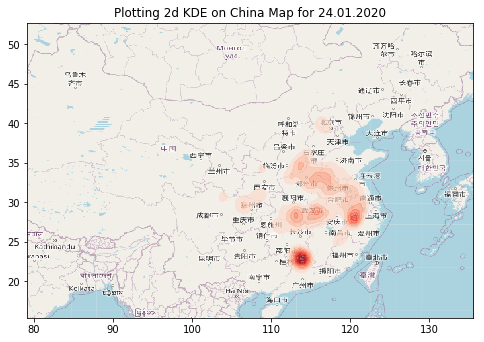

In [7]:
givendate = '24.01.2020'
df1 = df[df.date_confirmation == givendate]

twodkdeplot(givendate,df)

## Paper implementation

The formula for kernel density width is $h= 0.9 \times min(\sigma, \frac{IQR}{1.34}) \times n^{-\frac{1}{5}}$

In [8]:
#kernel density width
def get_kernel_denstiy_width(dataset_sample):
    sd = statistics.stdev(dataset_sample)
    iqr_val = iqr(dataset_sample, rng=(25,75), interpolation='midpoint')
    n = len(dataset_sample)
    return 0.9*min(sd, (iqr_val/1.34))*n**(-0.2)

Create a cubehelix color for plotting 2D KDE.

In [9]:
cubehelix_cs=[[0.0, 'rgba(255, 255, 255, 0)'],
              [0.1, 'rgba(227,242,253, 0.4)'],
              [0.2, 'rgba(187,222,251, 0.7)'],
              [0.3, 'rgba(144,202,249, 0.7)'],
              [0.4, 'rgba(100,181,246, 0.7)'],
              [0.5, 'rgba(66,165,245, 0.7)'],
              [0.6, 'rgba(30,136,229, 0.7)'],
              [0.7, 'rgba(25,118,210, 0.7)'],
              [0.8, 'rgba(21,101,192, 0.7)'],
              [0.9, 'rgba(13,71,161, 0.7)'],
              [1.0, 'rgba(8,50,135, 0.7)']]

Create a function for calculating two dimensional kernel density estimate given the dataset, weights and points. Where we first implemented a weighted gaussian kde because the dataset that we used contained information for regions and not for cases so we also had to add weight, but after looking for more suitable datasets we found a dataset with information for each case and then basically we only use 2D gaussian kde with similar weight importance.

The formula for density estimate is $f_{2D}(x,y) = \frac{1}{N} \sum_{i=1}^{N} \frac{1}{h_{s,i}^2}K_s (\frac{x-x_i}{h_{s,i}}, \frac{y-y_i}{h_{s,i}})$ and for gaussian kernel is $K_{s,t}(u) = \frac{1}{\sqrt{2 \times \pi}} e^{- \frac{1}{2} \times u^2}$

In [10]:
def weighted_gaussian_kde(dataset, weights, points):
    d, n = dataset.shape
    
    if weights is not None:
        weights = weights / np.sum(weights)
    else:
        weights = np.ones(n) / n
    
    neff = 1.0 / np.sum(weights ** 2)
    covariance_factor = np.power(neff*(d+2.0)/4.0, -1./(d+4))
        
    #compute covariance
    _mean = np.sum(weights * dataset, axis=1)
    _residual = (dataset - _mean[:, None])
    _data_covariance = np.atleast_2d(np.dot(_residual * weights, _residual.T))
    _data_covariance /= (1 - np.sum(weights ** 2))
    _data_inv_cov = np.linalg.inv(_data_covariance)
    covariance = _data_covariance * covariance_factor**2
    inv_cov = _data_inv_cov / covariance_factor**2
    #Gaussian norm factor
    #_norm_factor = np.sqrt(np.linalg.det(2*np.pi*covariance))
    #Triweight norm factor
    _norm_factor = np.linalg.det(32*covariance/35)
    
    d1, m = points.shape

    result = np.array([0.0] * m)

    whitening = np.linalg.cholesky(inv_cov)
    scaled_dataset = np.dot(whitening, dataset)
    scaled_points = np.dot(whitening, points)

    for i in range(n):
        diff = scaled_dataset[:, i, np.newaxis] - scaled_points
        energy =  np.sum(diff * diff, axis=0) / 2.0
        #Gaussian result
        result += weights[i]*np.exp(-energy)
        #Triweight result
        #result += weights[i]*(1-energy)**3
        
    result = result / _norm_factor
    return result

This function is used for adjusting the parameters of weighted gaussian kde and in here we return x axis y axis and the density for each of the points.

In [11]:
def kde_scipy( vals1, vals2, a,b, c,d, N, weights = None):

    x=np.linspace(a,b,N)
    y=np.linspace(c,d,N)
    X,Y=np.meshgrid(x,y)
    positions = np.vstack([Y.ravel(), X.ravel()])

    values = np.vstack([vals1, vals2])
    
    kernel = weighted_gaussian_kde(values,weights,positions)
    
    
    Z = np.reshape(kernel.T, X.shape)

    return [x, y, Z]

For `make_kdeplot` we use plotly with parameters x and y axis minimal and maximal values for longitude and latitude also the length of dataset colorscale title and weights. And function `show2dkdeplot` we have only one parameter where we give the dataframe that we are using and then we extract latitude and longitude from them also the max and min values and return the figure. In most cases because it takes a long time to load the plot we do not use all the dataset but filter to only use some rows for faster computation time.

In [12]:
 def make_kdeplot(varX, varY, a,b, c,d, N, colorsc, title, weights):
    x, y, Z = kde_scipy(varY, varX, a,b, c,d , N, weights)

    data = Data([
       Contour(z=Z, x=x, y=y, colorscale=colorsc, opacity=0.7, contours=Contours(showlines=False)),
     ])

    layout = Layout(
        title= title,
        font= Font(family='Georgia, serif',  color='#635F5D'),
        showlegend=False,
        autosize=False,
        width=650,
        height=650,
        xaxis=XAxis(range=[a,b],showgrid=False,nticks=7),
        yaxis=YAxis(range=[c,d],showgrid=False,nticks=7),
        margin=Margin(l=40,r=40,b=85,t=100,)
    )
    
    fig = Figure(data=data, layout=layout)
    fig.add_layout_image(
        dict(source="chinamap.png", xref="x", yref="y", x=a, y=d, sizex=b-a, sizey=d-c, sizing="stretch", opacity=1.0, layer="below")
    )

    return fig, Z, x, y


In [13]:
def show2dkdeplot(df1, givendate):
    
    x=df1['longitude'].tolist()
    y=df1['latitude'].tolist()

    x_min=min(df.longitude.tolist())
    x_max=max(df.longitude.tolist())
    y_min=min(df.latitude.tolist())
    y_max=max(df.latitude.tolist())


    N=len(x)
    fig, Z, xi, yi = make_kdeplot(x, y, x_min, x_max, y_min, y_max,
             N, cubehelix_cs,'Covid-19 in China on: ' + givendate, None)
    return fig

In [14]:
givendate = "25.01.2020"
df1 = df[df.date_confirmation == givendate]
#df1 = df1.iloc[0:20]
show2dkdeplot(df1, givendate)

In [15]:
givendate = "26.01.2020"
df1 = df[df.date_confirmation == givendate]
#df1 = df1.iloc[0:20]
show2dkdeplot(df1, givendate)

Function `create_df_from_Z_and_coords` we create a dataset that contains the coordinates and the density for each of the coordinates. 

In [16]:
def create_df_from_Z_and_coords(xi, yi, Z):
    data = {}
    data['x'] = xi.tolist()
    for i in range(0,len(yi)):
        yistr = str(yi[i])
        data[yistr] = Z[i].tolist()
    return pd.DataFrame (data)

Function `get_k_highest_values` is used for getting the highest density values from the first date so we save computation time by not checking all possible longitude latitude flows but only longitude and latitude flows from higher density values.

In [17]:
def get_k_highest_values(k, x_1, y_1, Z_1):
    data = []
    for i in range(0,len(x_1)):
        for j in range(0, len(y_1)):
            row = [x_1[i], y_1[j], Z_1[j][i]]
            data.append(row)
    sdi = np.transpose(data)
    idx = np.argpartition(sdi[2], -k)
    kdeval = sdi[2][idx[-k:]]
    xval = sdi[0][idx[-k:]]
    yval = sdi[1][idx[-k:]]
    return xval, yval, kdeval


In the function below we calculate the euclidean distance for the given longitude and latutude.

Formula for euclidean distance is given by:

$d(a,b) = \sqrt{\sum^{n}_{i=1}{(a_i - b_i)}^2}$

In [18]:
def euclidean_distance(long1,long2,lat1,lat2):
    x = (long1,lat1)
    y = (long2,lat2)
    distance = math.sqrt(sum([(a - b) ** 2 for a, b in zip(x, y)]))
    return distance


We use this function to get the 2D Kernel density values from a given dataset

In [27]:
def get_2dkde(dataset):
    x=dataset['longitude'].tolist()
    y=dataset['latitude'].tolist()
    x, y, Z = kde_scipy(y, x, min(df.longitude.tolist()),max(df.longitude.tolist()), min(df.latitude.tolist()), 
                        max(df.latitude.tolist()),2000, None)
    return x,y, Z

We use this function to get the datasets of density values for two given dates 

In [20]:
def get_2dkde_dataframes(t_1,t0):
    df_1 = df[df.date_confirmation == t_1]
    df_1 = df_1.iloc[0:10]
    x_1, y_1 , Z_1 = get_2dkde(df_1)
    res_1 = create_df_from_Z_and_coords(x_1, y_1, Z_1)
    res_1['date'] = t_1
    
    df0 = df[df.date_confirmation == t0]
    df0 = df0.iloc[0:10]
    x0, y0 , Z0 = get_2dkde(df0)
    res0 = create_df_from_Z_and_coords(x0, y0, Z0)
    res0['date'] = t0
    
    return res_1, res0

In [21]:
df_1, df0 = get_2dkde_dataframes('23.01.2020','24.01.2020')

We used `fmap3d` and `fmap_all` when we wanted to save computation time by not checking each coordinate of each day with the other day but only with W of its neighbours. When W gets higher it takes a really long time for this function to execute.

In [22]:
def fmap3d(W,T, x, y, t, zvalues, coords,a0=1,a1=1):
    res = 0    
    for i in range(x-W,x+W):
        if ((i < 0) or (i >= len(zvalues[0]))):
            continue
        for j in range(y-W, y+W):
            if ((j < 0) or (j >= len(zvalues[0]))):
                continue
            for k in range(t-T,t+T):
                if ((k < 0) or (k >= len(zvalues))):
                    continue
                #Mujm me lujt me fuqi a0 edhe a1, duhet me llogarit distancen
                
                dist = euclidean_distance(coords[t][0][x], coords[k][0][i], coords[t][1][x], coords[k][1][i])
                
                if dist != 0:
                    res += (zvalues[t][x][y]**a0) * (zvalues[k][i][j]**a1) / dist
    return res


                
def famp_all(W):
    values, cords = testfunc('23.01.2020','24.01.2020')
    n = len(values[0])
    t = len(values)
    
    result = [ [ [ 0 for x in range(n) ] for y in range(n) ] for k in range( t ) ]
    for k in range(0,t):
        for i in range(0,n):
            for j in range (0,n):
                result[k][i][j] = fmap3d(W, t, i, j, k, values, cords)
    return result, cords
                
            
            
            

Same as the function `get_k_highest_values` we use this function for saving computation time by not checking every value in the first date but only values with higher density, where we firstly select 15% of the highest values and then randomly select k1 coords from that 15%.

In [23]:
def get_k_highest_values_rand(k1, x_1, y_1, Z_1):
    k = int(len(x_1)*len(y_1)*0.15)
    data = []
    for i in range(0,len(x_1)):
        for j in range(0, len(y_1)):
            row = [x_1[i], y_1[j], Z_1[j][i]]
            data.append(row)
    sdi = np.transpose(data)
    idx = np.argpartition(sdi[2], -k)
    idx = idx[-k:]
    idxrand = np.random.randint(low=0, high=k, size=k1)
    idx = idx[idxrand]
    kdeval = sdi[2][idx]
    xval = sdi[0][idx]
    yval = sdi[1][idx]
    return xval, yval, kdeval


In this function we implement our gravity based flow map extraction and return the highest value from computation in order to know about the flow of Covid-19 cases.

Formula for gravity based flow map extraction is:

$FMap3D(x,y,t) = \sum^{W}_{p=-W}{\sum^{W}_{q=-W}{\sum^{T}_{r=-T}{(p,q,r) \frac{(f_{2D}(x,y)|_t)^{a_0} \times (f_{2D}(x_p,y_q)|_{t_r})^{a_1}}{d^{2}_{ij}}}}}$

where W is the kernel size in spatial axes, T is kernel size along time axes, $d_{ij}$ is the eucledian distance between $(x,y,t)$ and $(x_p,y_q,t_r)$ and $(f_{2D}(x,y)|_t)$ is the density value at $(x,y,t)$. a0 and a1 are used to stress certain time steps, in our case we use $a_0 = 1$ and $a_1 = 1$

In [24]:
def compare2(long, lat, zval, x0, y0, z0, k=1, a0 =1, a1=1):
    retval = []
    for i in range(0, len(x0)):
        dist = euclidean_distance(long,x0[i],lat,y0[i])
        if dist != 0:
            if (dist > 4) & (dist < 8 ):
                res = (zval**a0) * (z0[i]**a1) / dist
                retval.append([x0[i], y0[i], res])#z0[i]])
    sdi = np.transpose(retval)
    idx = np.argpartition(sdi[2], -1)
    sdi[2][idx[-1:]]
    return [sdi[0][idx[-1:]][0], sdi[1][idx[-1:]][0], sdi[2][idx[-1:]][0]]

This is the part where we visualize the spread of Covid-19 from one day to another using `matplotlib` and using arrow glyps we show the spread paterns of the disease. For this part we use `get_k_highest_values_rand` function for getting k highest density values for the first date, in order to have diversity of highest density values and not only k highest values.

In [ ]:
df_1 = df[df.date_confirmation == '23.01.2020']
#df_1 = df_1.iloc[0:20]
x_1, y_1 , Z_1 = get_2dkde(df_1)

hx_1, hy_1, hZ_1 = get_k_highest_values_rand(25, x_1, y_1, Z_1)


df0 = df[df.date_confirmation == '24.01.2020']
#df0 = df0.iloc[0:20]
x0, y0 , Z0 = get_2dkde(df0)
nz = len(Z0) * len(Z0[0])
hx0, hy0, hZ0 = get_k_highest_values(nz, x0, y0, Z0)
data = []
for i in range(0,len(hx_1)):
    compval = compare2(hx_1[i], hy_1[i], hZ_1[i], hx0, hy0, hZ0)
    data.append([hx_1[i], hy_1[i], compval])
img = plt.imread('chinamap.png')
BBox = (df.longitude.min()-3,   df.longitude.max()+3, df.latitude.min()-3, df.latitude.max()+3)
fig, ax = plt.subplots(figsize = (8,7))
ax.set_title('Plotting 2d KDE on China Map for ')
ax.set_xlim(BBox[0],BBox[1])
ax.set_ylim(BBox[2],BBox[3])
ax.imshow(img, zorder=0, extent = BBox, aspect= 'equal')
arrow_properties = dict(facecolor="black", width=0.5,headwidth=4, shrink=0.1)
#ax.annotate("", xy=(90, 20),xytext=(120, 40), arrowprops=arrow_properties)
for i in range(0, len(data)):
    ax.annotate("", xy=(data[i][2][0], data[i][2][1]),xytext=(data[i][0], data[i][1]), arrowprops=arrow_properties)

We do the same thing in here but use `get_k_highest_values` where we only get the k highest values.

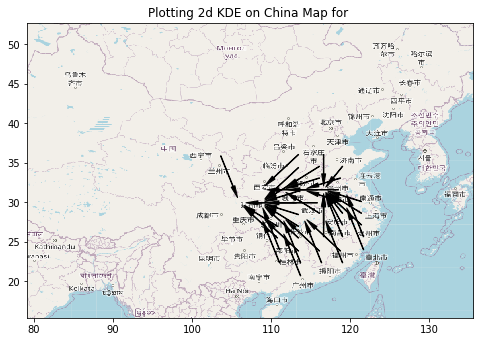

In [26]:
df_1 = df[df.date_confirmation == '23.01.2020']
df_1 = df_1.iloc[0:20]
x_1, y_1 , Z_1 = get_2dkde(df_1)

hx_1, hy_1, hZ_1 = get_k_highest_values(40, x_1, y_1, Z_1)


df0 = df[df.date_confirmation == '24.01.2020']
df0 = df0.iloc[0:20]
x0, y0 , Z0 = get_2dkde(df0)
nz = len(Z0) * len(Z0[0])
hx0, hy0, hZ0 = get_k_highest_values(nz, x0, y0, Z0)
data = []
for i in range(0,len(hx_1)):
    compval = compare2(hx_1[i], hy_1[i], hZ_1[i], hx0, hy0, hZ0)
    data.append([hx_1[i], hy_1[i], compval])
img = plt.imread('chinamap.png')
BBox = (df.longitude.min()-3,   df.longitude.max()+3, df.latitude.min()-3, df.latitude.max()+3)
fig, ax = plt.subplots(figsize = (8,7))
ax.set_title('Plotting 2d KDE on China Map for ')
ax.set_xlim(BBox[0],BBox[1])
ax.set_ylim(BBox[2],BBox[3])
ax.imshow(img, zorder=0, extent = BBox, aspect= 'equal')
arrow_properties = dict(facecolor="black", width=0.5,headwidth=4, shrink=0.1)
#ax.annotate("", xy=(90, 20),xytext=(120, 40), arrowprops=arrow_properties)
for i in range(0, len(data)):
    ax.annotate("", xy=(data[i][2][0], data[i][2][1]),xytext=(data[i][0], data[i][1]), arrowprops=arrow_properties)